In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
train_path = '/content/drive/MyDrive/Sports_dataset/Dataset/Train'
test_path = '/content/drive/MyDrive/Sports_dataset/Dataset/Test'

In [3]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.preprocessing import LabelEncoder

In [4]:
# 1. Preprocessing: Create a DataFrame
def create_dataframe(directory):
    data = []
    for filename in os.listdir(directory):
        if filename.endswith('.jpg') or filename.endswith('.png'):
            # Extract label from filename
            label = filename.split('_')[0]
            filepath = os.path.join(directory, filename)
            data.append((filepath, label))
    return pd.DataFrame(data, columns=['image', 'label'])

train_df = create_dataframe(train_path)

In [5]:
# Display the DataFrame as a table
display(train_df)

,image,label
0,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing
1,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing
2,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing
3,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing
4,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing
...,...,...
1675,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing
1676,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing
1677,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing
1678,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing


In [6]:
# Encode labels
label_encoder = LabelEncoder()
train_df['encoded_label'] = label_encoder.fit_transform(train_df['label'])

In [7]:
# Display the updated DataFrame
print("DataFrame with Encoded Labels:")
display(train_df)

DataFrame with Encoded Labels:


,image,label,encoded_label
0,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2
1,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2
2,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2
3,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2
4,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2
...,...,...,...
1675,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2
1676,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2
1677,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2
1678,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2


In [8]:
from PIL import Image
from collections import Counter

def check_image_sizes(image_paths, sample_size=None):
    sizes = []
    for i, img_path in enumerate(image_paths):
        if sample_size and i >= sample_size:  # Stop if we've reached the sample size
            break
        with Image.open(img_path) as img:
            sizes.append(img.size)  # Append the (width, height) of each image
    return Counter(sizes)  # Return counts of each unique size

# Check image sizes (limit to 100 images for sampling, or remove sample_size for all)
image_size_counts = check_image_sizes(train_df['image'], sample_size=100)

# Print summary
print("Unique image sizes and their counts:")
for size, count in image_size_counts.items():
    print(f"Size: {size}, Count: {count}")

# Optional: Print total number of unique sizes
print("Total unique image sizes:", len(image_size_counts))

Unique image sizes and their counts:
Size: (224, 224), Count: 70
Size: (612, 408), Count: 7
Size: (2025, 1351), Count: 1
Size: (800, 450), Count: 1
Size: (2560, 1650), Count: 1
Size: (624, 351), Count: 1
Size: (612, 401), Count: 1
Size: (600, 315), Count: 1
Size: (2250, 1500), Count: 1
Size: (1600, 900), Count: 1
Size: (408, 612), Count: 2
Size: (1500, 1000), Count: 1
Size: (612, 413), Count: 1
Size: (1200, 675), Count: 1
Size: (2048, 1152), Count: 1
Size: (612, 575), Count: 1
Size: (1024, 1536), Count: 1
Size: (699, 377), Count: 1
Size: (550, 612), Count: 1
Size: (2500, 1376), Count: 1
Size: (612, 407), Count: 1
Size: (612, 454), Count: 1
Size: (612, 394), Count: 1
Size: (1000, 703), Count: 1
Total unique image sizes: 24


In [9]:
train_imgs=os.listdir(train_path)
test_imgs=os.listdir(test_path)

In [10]:
code = {'Basketball' : 0 , 'Football' : 1 , 'Rowing' : 2 , 'Swimming' :3 ,"Tennis" : 4 , "Yoga" : 5}

def get_name(n):

    for x,y in code.items() :
        if y == n :
            return x

In [11]:
#get labels for training
train_labels = []

for cur_img in train_imgs:
    if "Basketball" in cur_img :
        label = (code["Basketball"])
    elif "Football" in cur_img :
        label = (code["Football"])
    elif "Rowing" in cur_img :
        label = (code["Rowing"])
    elif "Swimming" in cur_img :
        label = (code["Swimming"])
    elif "Tennis" in cur_img :
        label = (code["Tennis"])
    elif "Yoga" in cur_img :
        label = (code["Yoga"])

    train_labels.append(label)

In [12]:
#reading images
def reading_resize(train_imgs,train_path,image_size):
    l=[]
    for g in train_imgs:
        img_path=os.path.join(train_path,g)
        img=cv2.imread(img_path)
        img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        res = cv2.resize(img, (image_size, image_size))
        l.append(res)

    return l

In [13]:
#reading training data
image_size=224
l_train=reading_resize(train_imgs,train_path,image_size)

In [14]:
#reading test data
l_test=reading_resize(test_imgs,test_path,image_size)

In [15]:
train = np.array(l_train)
labels=np.array(train_labels)
print(train.shape)

(1681, 224, 224, 3)


In [16]:
test = np.array(l_test)
print(test.shape)

(688, 224, 224, 3)


Basketball


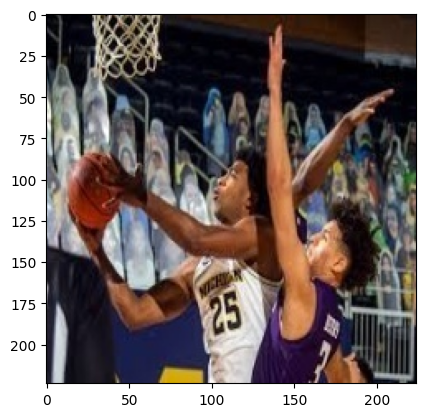

In [17]:
plt.imshow(train[1000])
print(get_name(labels[1000]))

In [18]:
pd.DataFrame(labels).value_counts()

,count
0,
5,458
1,400
3,240
2,202
0,196
4,185


In [19]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(train , labels, test_size = 0.2,stratify=labels,shuffle=True)

In [20]:
X_train =X_train/255.0
X_val =X_val/255.0

In [21]:
# Train labels
y_train=tf.keras.utils.to_categorical(y_train)

# Test labels
y_val=tf.keras.utils.to_categorical(y_val)

In [22]:
y_train.shape

(1344, 6)

In [25]:
size=224
model=tf.keras.models.Sequential([

    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(size, size, 3)),
    tf.keras.layers.BatchNormalization(axis=-1),
    tf.keras.layers.MaxPool2D((2,2)),

    tf.keras.layers.Conv2D(32, (3, 3), activation='relu',kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    tf.keras.layers.BatchNormalization(axis=-1),
    tf.keras.layers.MaxPool2D((2,2)),

    tf.keras.layers.Conv2D(64, (3, 3), activation='relu',kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    tf.keras.layers.BatchNormalization(axis=-1),
    tf.keras.layers.MaxPool2D((2,2)),


    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation = 'relu',kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Dense(32, activation = 'relu',kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    tf.keras.layers.Dropout(0.25),

    tf.keras.layers.Dense(6,activation=tf.nn.softmax)

])
model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 222, 222, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 109, 109, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 109, 109, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 54, 54, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 52, 52, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 52, 52, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 26, 26, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 43264)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │       2,768,960 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 6)                   │             198 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,800,390 (10.68 MB)

 Trainable params: 2,800,134 (10.68 MB)

 Non-trainable params: 256 (1.00 KB)

In [31]:
# Compile
optim = tf.keras.optimizers.SGD(learning_rate=0.001)
model.compile(loss='categorical_crossentropy',optimizer=optim,metrics=['accuracy'])

In [42]:
 #data augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator


train_generator = ImageDataGenerator(
    rotation_range=0.5,
    width_shift_range=0.2,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
)

In [33]:
tf.random.set_seed(42)



Epochs=30

#checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,save_best_only=True, save_weights_only=True, verbose=1)
history = model.fit(X_train,y_train,
                    epochs=Epochs,
                    validation_data=(X_val,y_val),
                    batch_size=32,
                    verbose=1)
# callbacks=[early_stopping]
# early_stop = EarlyStopping(patience=5,monitor='val_loss',restore_best_weights=True)

Epoch 1/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 244s 4s/step - accuracy: 0.4903 - loss: 3.7729 - val_accuracy: 0.1246 - val_loss: 4.2969
Epoch 2/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 200s 4s/step - accuracy: 0.5734 - loss: 3.6312 - val_accuracy: 0.1246 - val_loss: 4.4513
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 206s 5s/step - accuracy: 0.6421 - loss: 3.4098 - val_accuracy: 0.2344 - val_loss: 4.4350
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 199s 4s/step - accuracy: 0.6683 - loss: 3.3149 - val_accuracy: 0.3205 - val_loss: 4.3609
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 202s 4s/step - accuracy: 0.7222 - loss: 3.1804 - val_accuracy: 0.3412 - val_loss: 4.2815
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 184s 4s/step - accuracy: 0.7522 - loss: 3.1187 - val_accuracy: 0.4392 - val_loss: 4.0878
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 203s 4s/step - accuracy: 0.7962 - loss: 3.0112 - val_accuracy: 0.4540 - val_loss: 3.9437
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 201s 4s/step - accuracy: 0.8178 - loss: 3.0083 - val_accuracy: 0.5074 - v

In [34]:
# Save the model to your Google Drive
model.save('/content/drive/MyDrive/Sports_dataset/CNN.h5')

In [ ]:
from keras.models import load_model

# Load the model from the .h5 file
model = load_model('CNN.h5')

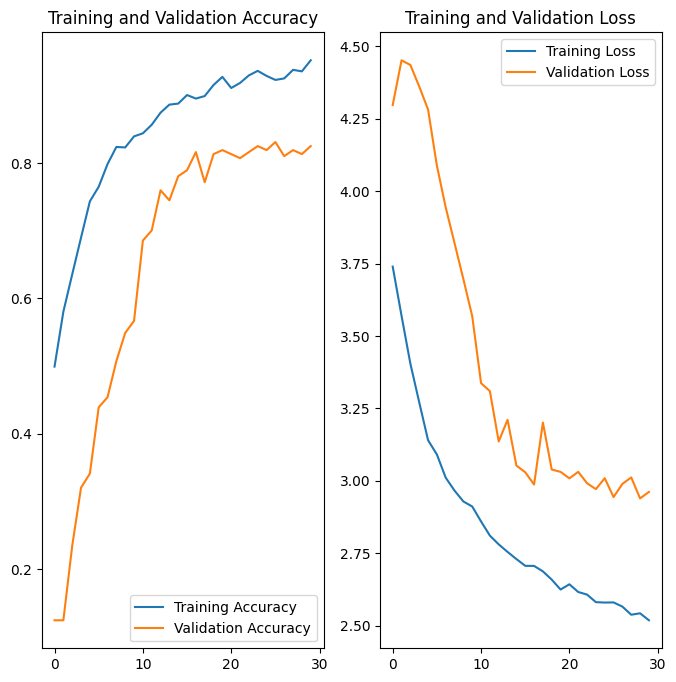

In [35]:
training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']

training_loss = history.history['loss']
validation_loss = history.history['val_loss']

epochs_range=range(Epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, training_accuracy, label='Training Accuracy')
plt.plot(epochs_range, validation_accuracy, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, training_loss, label='Training Loss')
plt.plot(epochs_range, validation_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [36]:
model.evaluate(X_val,y_val)

11/11 ━━━━━━━━━━━━━━━━━━━━ 10s 913ms/step - accuracy: 0.7885 - loss: 2.9713


[2.961773633956909, 0.8249258399009705]

In [37]:
p=model.predict(X_val)

11/11 ━━━━━━━━━━━━━━━━━━━━ 10s 949ms/step


In [38]:
np.argmax(p[0])
y_val[0]

array([1., 0., 0., 0., 0., 0.])

In [39]:
get_name(np.argmax(p[0])) ,get_name(np.argmax(y_val[0]))

('Basketball', 'Basketball')

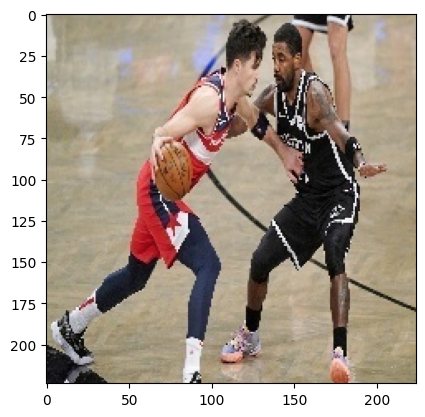

Basketball


In [40]:
plt.imshow(X_val[0],cmap=plt.cm.binary)#cmap means how the imgae to be presented
plt.show()
print(get_name(np.argmax(p[0])))

11/11 ━━━━━━━━━━━━━━━━━━━━ 8s 703ms/step


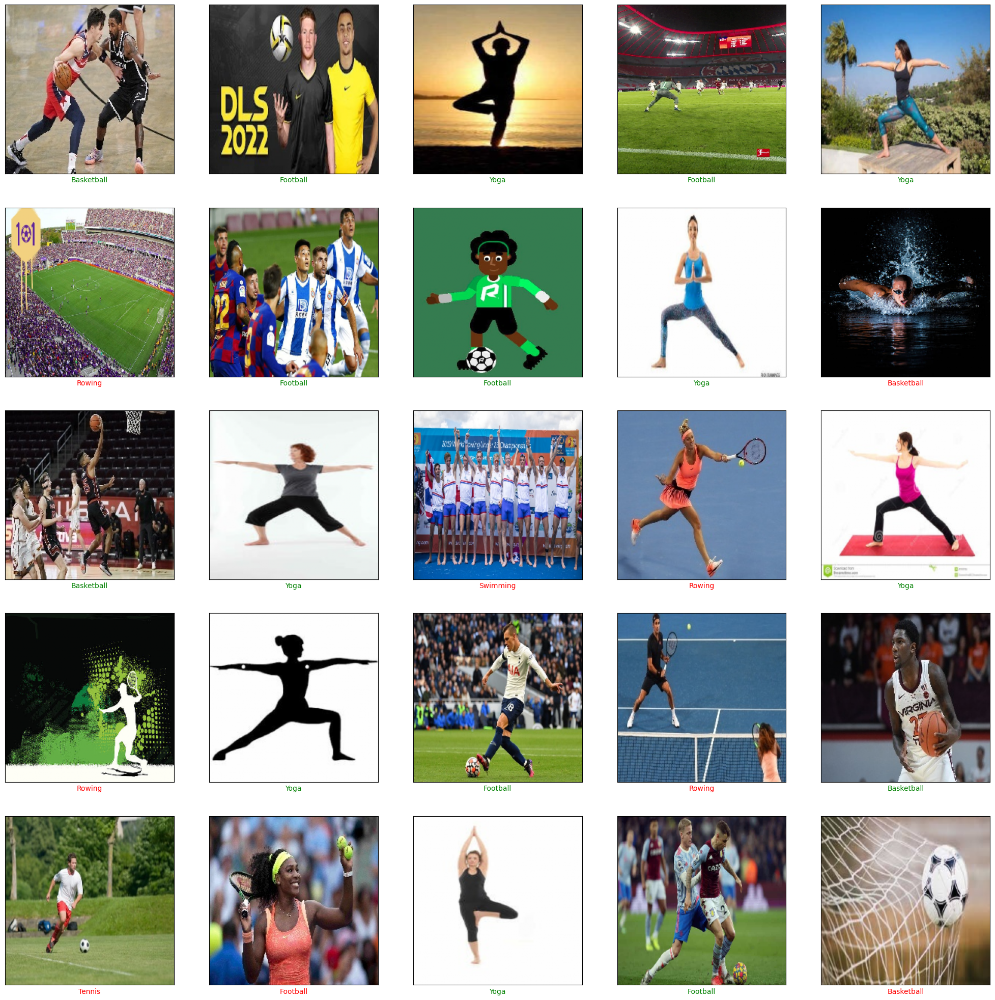

In [41]:
#pred
p=model.predict(X_val)

plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(X_val[i])
    color = 'green' if get_name(np.argmax(p[i])) == get_name(np.argmax(y_val[i])) else 'red'
    plt.xlabel(get_name(np.argmax(p[i])),color=color)
plt.show()

In [44]:
#reading test data
l_test=reading_resize(test_imgs,test_path,image_size)

In [45]:
test = np.array(l_test)
print(test.shape)

(688, 224, 224, 3)


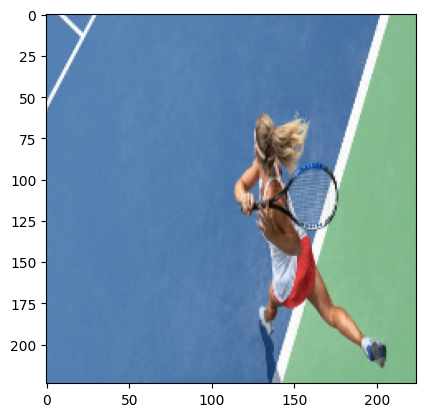

In [46]:
plt.imshow(test[200])

In [47]:
test_names=[]
for g in test_imgs:
    test_names.append(g)

In [48]:
#normalize
test=test/255.0

In [49]:
test_out=model.predict(test)

22/22 ━━━━━━━━━━━━━━━━━━━━ 20s 832ms/step


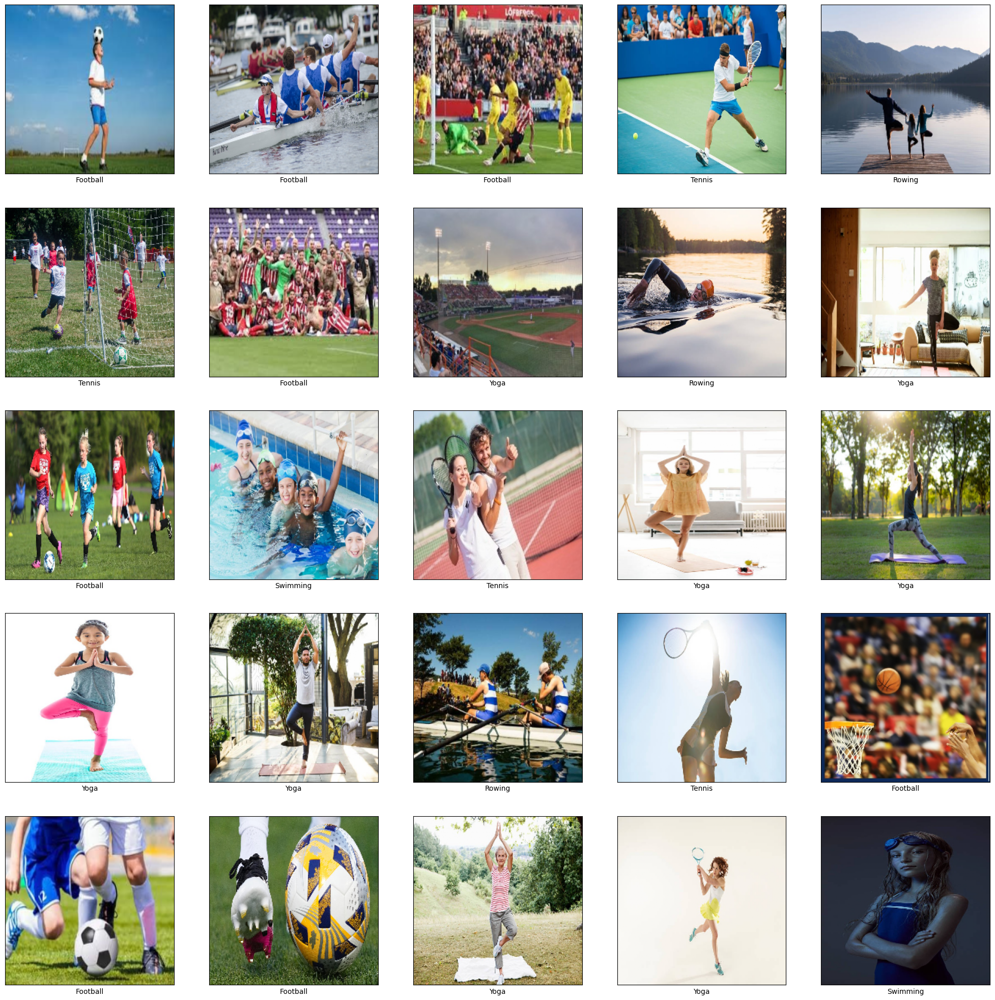

In [50]:
#pred
p=test_out

plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(test[i])
    plt.xlabel(get_name(np.argmax(p[i])))
plt.show()

In [51]:
pred_out=[]
for i in range(len(test_out)):
    label=np.argmax(test_out[i])
    pred_out.append([test_names[i],label])

pred_out

[['111.jpg', 1],
 ['112.jpg', 1],
 ['106.jpg', 1],
 ['0.jpg', 4],
 ['10.jpg', 2],
 ['102.jpg', 4],
 ['101.jpg', 1],
 ['107.jpg', 5],
 ['114.jpg', 2],
 ['113.jpg', 5],
 ['108.jpg', 1],
 ['110.jpg', 3],
 ['1.jpg', 4],
 ['105.jpg', 5],
 ['100.jpg', 5],
 ['11.jpg', 5],
 ['104.jpg', 5],
 ['103.jpg', 2],
 ['109.jpg', 4],
 ['115.jpg', 1],
 ['144.jpg', 1],
 ['139.jpg', 1],
 ['16.jpg', 5],
 ['143.jpg', 5],
 ['117.jpg', 3],
 ['132.jpg', 4],
 ['154.jpg', 3],
 ['126.jpg', 4],
 ['156.jpg', 2],
 ['165.jpg', 5],
 ['116.jpg', 4],
 ['12.jpg', 3],
 ['163.jpg', 5],
 ['142.jpg', 1],
 ['150.jpg', 2],
 ['127.jpg', 5],
 ['145.jpg', 2],
 ['146.jpg', 1],
 ['141.jpg', 1],
 ['118.jpg', 5],
 ['167.jpg', 1],
 ['149.jpg', 1],
 ['151.jpg', 5],
 ['162.jpg', 1],
 ['123.jpg', 2],
 ['147.jpg', 3],
 ['159.jpg', 1],
 ['119.jpg', 1],
 ['135.jpg', 3],
 ['155.jpg', 1],
 ['166.jpg', 1],
 ['122.jpg', 1],
 ['160.jpg', 0],
 ['128.jpg', 5],
 ['169.jpg', 1],
 ['15.jpg', 5],
 ['130.jpg', 2],
 ['131.jpg', 5],
 ['17.jpg', 3],
 ['14.j